# ML-ImmuneProfiler

## Single-Cell RNA-seq Cell Type Classification: Notebook 5

## Random Forest Classifier and Boosted Random Forest Classifier

- Date: 2025-04-17

## Overview

This notebook implements and evaluates two tree-based ensemble methods for single-cell RNA-seq cell type classification:

1. **Random Forest Classifier**: A standard ensemble of decision trees that uses bagging and feature randomness to create a robust classifier
2. **Boosted Random Forest**: An advanced implementation that combines boosting with random forests to improve classification performance on imbalanced data

Both models are trained on preprocessed single-cell data and evaluated using:
- Classification metrics (accuracy, precision, recall, F1-score)
- Confusion matrices
- ROC curves and Precision-Recall curves
- Feature importance analysis
- Dimensionality reduction visualizations (t-SNE and UMAP)

The notebook also implements HyperSMURF for handling class imbalance in the Boosted Random Forest approach and compares the performance of both models.

In [20]:
# === Core Scientific & Machine Learning Libraries ===
import numpy as np                                  # Numerical operations
import pandas as pd                                 # DataFrame manipulation
import matplotlib.pyplot as plt                     # Basic plotting
import seaborn as sns                               # Advanced visualization

# === Scanpy & Dimensionality Reduction ===
import scanpy as sc                                 # For AnnData object and graph-based clustering
import umap                                         # UMAP dimensionality reduction
from sklearn.manifold import TSNE                   # t-SNE visualization

# === Graph Libraries for Community Detection ===
import igraph as ig                                 # Graph structure for Leiden/Louvain
import leidenalg                                    # Leiden clustering

# === Scikit-Learn: Dimensionality Reduction, Clustering, Encoding ===
from sklearn.decomposition import PCA               # PCA reduction
from sklearn.preprocessing import StandardScaler    # Normalize gene expression
from sklearn.preprocessing import LabelEncoder      # Encode cell types
from sklearn.preprocessing import label_binarize    # Binarize labels for ROC/PR

# === Scikit-Learn: Evaluation Metrics ===
from sklearn.metrics import (
    adjusted_rand_score, silhouette_score,          # Clustering validation
    classification_report, accuracy_score,          # Classification evaluation
    f1_score, precision_score, recall_score,        # F1, precision, recall
    log_loss, confusion_matrix,                     # Log loss, confusion matrix
    roc_curve, auc,                                 # ROC and AUC
    precision_recall_curve, average_precision_score # PR curve & area
)

# === Scikit-Learn: Modeling and Cross-Validation ===
from sklearn.model_selection import (
    train_test_split, GridSearchCV, cross_validate  # Data split & model tuning
)
from sklearn.ensemble import RandomForestClassifier # Random Forest model
from sklearn.tree import DecisionTreeClassifier     # Used in Boosted RF example
from sklearn.base import BaseEstimator, ClassifierMixin # Custom model inheritance
from sklearn.utils import shuffle                   # Shuffle arrays
from sklearn.utils.class_weight import compute_class_weight # Class imbalance

# === Utility & Support Functions ===
from typing import Dict, Any, List                  # Type hinting for clean APIs
from joblib import load                             # Load pre-trained models
import joblib                                       # Save/load models
import pickle                                       # Store intermediate outputs
import os                                           # File system operations
from collections import Counter                     # Count elements efficiently
from itertools import cycle                         # Cyclic iterator (used for plotting color cycles)

In [2]:
#dataset loading
def load_dataset(file_path: str) -> Dict[str, Any]:
    """
    Load a dataset from a joblib-saved file and display key details.

    Args:
        file_path (str): Relative or absolute path to the .pkl file.

    Returns:
        Dict[str, Any]: A dictionary containing all dataset components such as
                        splits (train/val/test), metadata, encoder, etc.
    """
    dataset = load(file_path)

    print(" Dataset components loaded:")
    for key, value in dataset.items():
        if isinstance(value, (np.ndarray, pd.DataFrame)):
            print(f" - {key}: shape {value.shape}")
        else:
            print(f" - {key}: type {type(value)}")
    return dataset

# === Load dataset ===
dataset = load_dataset('spv_split_dataset_100hvg.pkl')

# === Extract individual components ===
X_train      = dataset['X_train']
X_val        = dataset['X_val']
X_test       = dataset['X_test']
y_train      = dataset['y_train']
y_val        = dataset['y_val']
y_test       = dataset['y_test']
meta_train   = dataset['meta_train']
meta_val     = dataset['meta_val']
meta_test    = dataset['meta_test']
label_encoder = dataset['label_encoder']
class_weights = dataset['class_weights']
feature_genes = dataset['feature_genes']

# === confirm shapes ===
print("\n Dataset successfully unpacked:")
print(f" - X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f" - X_val:   {X_val.shape}, y_val:   {y_val.shape}")
print(f" - X_test:  {X_test.shape}, y_test:  {y_test.shape}")

 Dataset components loaded:
 - X_train: shape (53825, 100)
 - X_val: shape (11534, 100)
 - X_test: shape (11534, 100)
 - y_train: shape (53825,)
 - y_val: shape (11534,)
 - y_test: shape (11534,)
 - meta_train: shape (53825, 1)
 - meta_val: shape (11534, 1)
 - meta_test: shape (11534, 1)
 - label_encoder: type <class 'sklearn.preprocessing._label.LabelEncoder'>
 - class_weights: type <class 'dict'>
 - feature_genes: type <class 'list'>

 Dataset successfully unpacked:
 - X_train: (53825, 100), y_train: (53825,)
 - X_val:   (11534, 100), y_val:   (11534,)
 - X_test:  (11534, 100), y_test:  (11534,)


/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.6.1 when using version 1.5.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


/tmp/ipykernel_3572536/2381476180.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_split, x='label', order=order, ax=ax, palette='Set2')
/tmp/ipykernel_3572536/2381476180.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_split, x='label', order=order, ax=ax, palette='Set2')
/tmp/ipykernel_3572536/2381476180.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_split, x='label', order=order, ax=ax, palette='Set2')


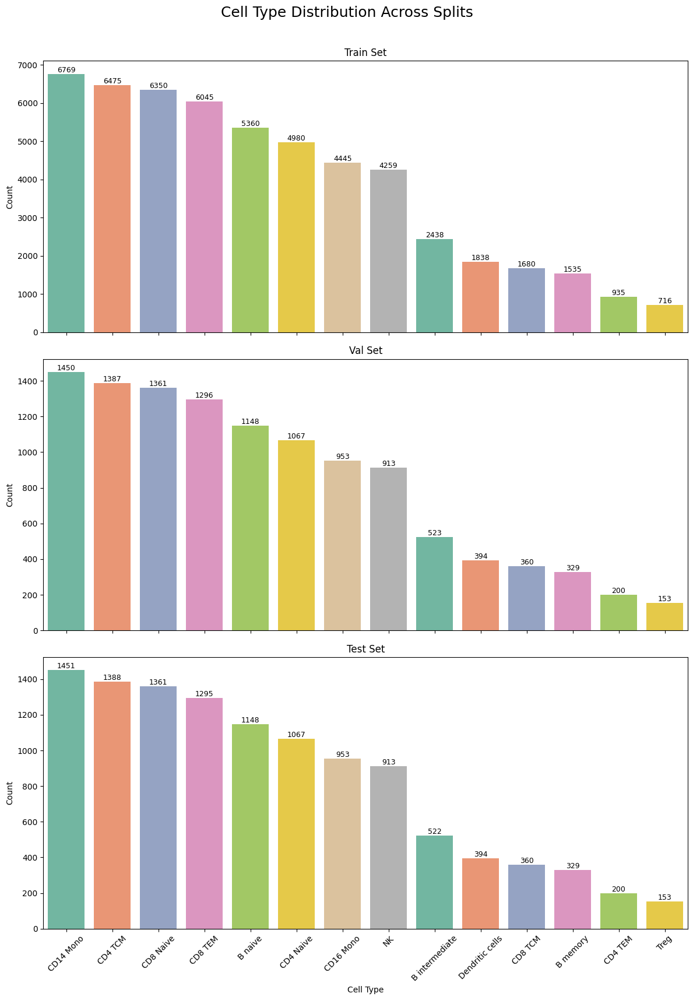

In [3]:
# create cell type distribution plot for train/test/val
# === Decode all labels ===
def decode(labels):
    return label_encoder.inverse_transform(labels) if hasattr(label_encoder, 'inverse_transform') else labels
df_train = pd.DataFrame({'label': decode(y_train), 'split': 'train'})
df_val   = pd.DataFrame({'label': decode(y_val), 'split': 'val'})
df_test  = pd.DataFrame({'label': decode(y_test), 'split': 'test'})

# === Combine all splits ===
df_all = pd.concat([df_train, df_val, df_test])

# === Create vertically stacked plots ===
fig, axes = plt.subplots(3, 1, figsize=(12, 18), sharex=True)
for ax, split_name in zip(axes, ['train', 'val', 'test']):
    df_split = df_all[df_all['split'] == split_name]
    order = df_split['label'].value_counts().sort_values(ascending=False).index
    sns.countplot(data=df_split, x='label', order=order, ax=ax, palette='Set2')
    ax.set_title(f'{split_name.capitalize()} Set')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)
    for p in ax.patches:
        height = int(p.get_height())
        ax.annotate(str(height), (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=9)
axes[-1].set_xlabel('Cell Type') 
plt.suptitle('Cell Type Distribution Across Splits', fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [6]:
# Citation:  Y. Mishina, R. Murata, Y. Yamauchi, T. Yamashita, and H. Fujiyoshi, "Boosted Random Forest," IEICE Transactions on Information and Systems, vol. E98.D, no. 9, pp. 1630-1636, Sep. 2015. [Online]. Available: https://www.jstage.jst.go.jp/article/transinf/E98.D/9/E98.D_2014OPP0004/_article/-char/en. DOI: 10.1587/transinf.2014OPP0004.
# === Boosted Random Forest Class ===
class BoostedRandomForest(BaseEstimator, ClassifierMixin):
    def __init__(self, n_estimators=300, max_depth=20):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.trees = []
        self.alphas = []
    def fit(self, X, y):
        N = X.shape[0]
        self.classes_ = np.unique(y)  
        sample_weights = np.ones(N) / N  
        for t in range(self.n_estimators):
            idx = np.random.choice(N, size=N, replace=True, p=sample_weights)  
            X_bootstrap, y_bootstrap = X[idx], y[idx]
            tree = DecisionTreeClassifier(
                max_depth=self.max_depth,
                min_samples_split=5,
                min_samples_leaf=3
            )
            tree.fit(X_bootstrap, y_bootstrap)  
            y_pred_train = tree.predict(X)  
            errors = (y_pred_train != y).astype(int)  
            epsilon_t = np.sum(sample_weights * errors) / np.sum(sample_weights)  
            alpha_t = 0.5 * np.log((len(self.classes_) - 1) * (1 - epsilon_t) / (epsilon_t + 1e-10))  
            sample_weights *= np.exp(alpha_t * errors) 
            sample_weights = np.clip(sample_weights, 1e-10, np.inf) 
            sample_weights /= np.sum(sample_weights)  
            self.trees.append(tree)
            self.alphas.append(alpha_t)
            if t % 50 == 0 or t == self.n_estimators - 1:
                print(f"BRF Training Progress: {t+1}/{self.n_estimators} Trees Built")
        return self
    def predict(self, X):
        tree_preds = np.array([tree.predict(X) for tree in self.trees]).T
        final_preds = mode(tree_preds, axis=1, keepdims=False)[0] 
        return final_preds
    def predict_proba(self, X):
        n_classes = len(self.classes_)  
        class_indices = {c: i for i, c in enumerate(self.classes_)}  
        proba = np.zeros((X.shape[0], n_classes))  
        for alpha_t, tree in zip(self.alphas, self.trees):
            tree_proba = tree.predict_proba(X)  
            for j, cls in enumerate(self.classes_):
                idx = class_indices[cls]  
                proba[:, idx] += alpha_t * tree_proba[:, j]  
        proba = np.exp(proba) 
        proba /= np.sum(proba, axis=1, keepdims=True)  
        return proba

    @property
    def feature_importances_(self):
        n_features = self.trees[0].n_features_in_  
        importances = np.zeros(n_features) 
        for alpha_t, tree in zip(self.alphas, self.trees):
            importances += alpha_t * tree.feature_importances_  
        importances /= np.sum(self.alphas)  
        return importances

# I used method from this article (because in genomic datasets, especially for sparse daatsets like Single cell RNA-seq we could not use directly classical SMOTE method): Schubach, M., Re, M., Robinson, P.N. et al. Imbalance-Aware Machine Learning for Predicting Rare and Common Disease-Associated Non-Coding Variants. Sci Rep 7, 2959 (2017). https://doi.org/10.1038/s41598-017-03011-5
# === HyperSMURF Training ===
def hypersmurf_train_brf(X, y, n_partitions=5):
    X, y = shuffle(X, y, random_state=42)
    majority_class = Counter(y).most_common(1)[0][0]
    minority_mask = y != majority_class
    X_pos = X[minority_mask].to_numpy() if hasattr(X, "to_numpy") else X[minority_mask]
    X_neg = X[~minority_mask].to_numpy() if hasattr(X, "to_numpy") else X[~minority_mask]
    y_pos = y[minority_mask]  
    y_neg = y[~minority_mask]
    neg_parts = np.array_split(X_neg, n_partitions)
    y_neg_parts = np.array_split(y_neg, n_partitions)
    models = []
    for i in range(n_partitions):
        print(f"[HyperSMURF] Training BRF model {i+1}/{n_partitions}")
        X_bal = np.vstack([X_pos, neg_parts[i]])
        y_bal = np.concatenate([y_pos, y_neg_parts[i]])
        model = BoostedRandomForest(n_estimators=300, max_depth=20)
        model.fit(X_bal, y_bal)
        models.append(model)
    return models

# === Ensemble Prediction ===
def hypersmurf_predict(models: List[BoostedRandomForest], X):
    probs = np.array([m.predict_proba(X) for m in models])
    avg_probs = np.mean(probs, axis=0)
    preds = np.argmax(avg_probs, axis=1)
    return preds, avg_probs

# === RUN EVERYTHING ===

# Train ensemble on training set
brf_ensemble = hypersmurf_train_brf(X_train, y_train)

# Predict on validation set
y_val_pred, y_val_proba = hypersmurf_predict(brf_ensemble, X_val)
y_val_labels = label_encoder.inverse_transform(y_val)
y_val_pred_labels = label_encoder.inverse_transform(y_val_pred)

print("\n[Validation Performance]")
print(classification_report(y_val_labels, y_val_pred_labels))
print("Log Loss:", log_loss(y_val, y_val_proba))

# Predict on test set
y_test_pred, y_test_proba = hypersmurf_predict(brf_ensemble, X_test)
y_test_labels = label_encoder.inverse_transform(y_test)
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)

print("\n[Test Performance]")
print(classification_report(y_test_labels, y_test_pred_labels))
print("Log Loss:", log_loss(y_test, y_test_proba))

# Save predictions
df_preds = pd.DataFrame({
    "Actual": y_test_labels,
    "Predicted": y_test_pred_labels
})
df_preds.to_csv("hypersmurf_brf_predictions.csv", index=False)

# Save model ensemble
joblib.dump(brf_ensemble, "hypersmurf_brf_ensemble.pkl")
print("\n Saved: hypersmurf_brf_predictions.csv and hypersmurf_brf_ensemble.pkl")

[HyperSMURF] Training BRF model 1/5
BRF Training Progress: 1/300 Trees Built
BRF Training Progress: 51/300 Trees Built
BRF Training Progress: 101/300 Trees Built
BRF Training Progress: 151/300 Trees Built
BRF Training Progress: 201/300 Trees Built
BRF Training Progress: 251/300 Trees Built
BRF Training Progress: 300/300 Trees Built
[HyperSMURF] Training BRF model 2/5
BRF Training Progress: 1/300 Trees Built
BRF Training Progress: 51/300 Trees Built
BRF Training Progress: 101/300 Trees Built
BRF Training Progress: 151/300 Trees Built
BRF Training Progress: 201/300 Trees Built
BRF Training Progress: 251/300 Trees Built
BRF Training Progress: 300/300 Trees Built
[HyperSMURF] Training BRF model 3/5
BRF Training Progress: 1/300 Trees Built
BRF Training Progress: 51/300 Trees Built
BRF Training Progress: 101/300 Trees Built
BRF Training Progress: 151/300 Trees Built
BRF Training Progress: 201/300 Trees Built
BRF Training Progress: 251/300 Trees Built
BRF Training Progress: 300/300 Trees Buil

/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted


[Validation Performance]
                 precision    recall  f1-score   support

 B intermediate       0.69      0.64      0.67       523
       B memory       0.74      0.53      0.62       329
        B naive       0.85      0.94      0.89      1148
      CD14 Mono       0.99      0.94      0.97      1450
      CD16 Mono       0.93      0.99      0.96       953
      CD4 Naive       0.73      0.76      0.75      1067
        CD4 TCM       0.77      0.79      0.78      1387
        CD4 TEM       0.69      0.47      0.56       200
      CD8 Naive       0.82      0.89      0.85      1361
        CD8 TCM       0.72      0.64      0.68       360
        CD8 TEM       0.92      0.94      0.93      1296
Dendritic cells       0.97      0.98      0.97       394
             NK       0.98      0.98      0.98       913
           Treg       0.83      0.36      0.50       153

       accuracy                           0.86     11534
      macro avg       0.83      0.78      0.79     11534
   

/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/hice1/imusayeva3/.conda/envs/brf_dnn_env/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted


[Test Performance]
                 precision    recall  f1-score   support

 B intermediate       0.68      0.67      0.67       522
       B memory       0.69      0.51      0.58       329
        B naive       0.87      0.93      0.90      1148
      CD14 Mono       0.99      0.94      0.96      1451
      CD16 Mono       0.93      0.99      0.96       953
      CD4 Naive       0.74      0.74      0.74      1067
        CD4 TCM       0.78      0.79      0.79      1388
        CD4 TEM       0.73      0.49      0.59       200
      CD8 Naive       0.80      0.90      0.85      1361
        CD8 TCM       0.75      0.58      0.65       360
        CD8 TEM       0.91      0.95      0.93      1295
Dendritic cells       0.98      0.99      0.99       394
             NK       0.98      0.98      0.98       913
           Treg       0.87      0.35      0.50       153

       accuracy                           0.86     11534
      macro avg       0.84      0.77      0.79     11534
   weight

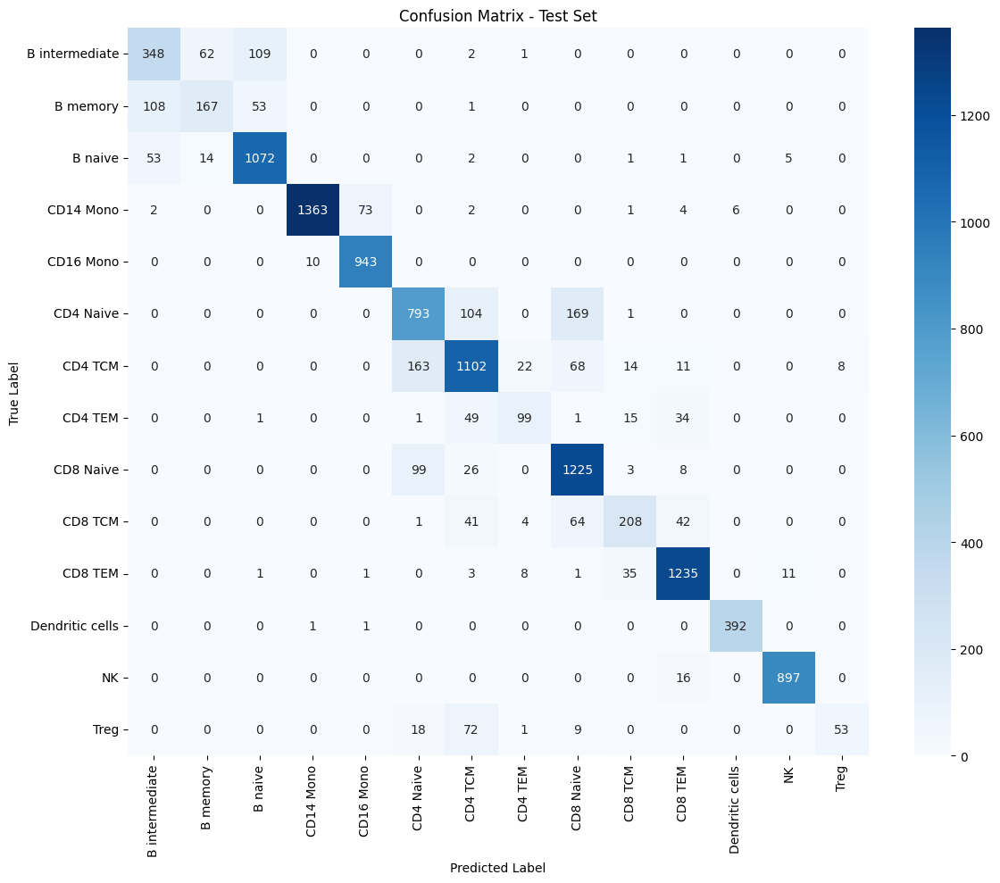

In [12]:
# Create the confusion matrix using true and predicted labels (on the test set)
cm = confusion_matrix(y_test_labels, y_test_pred_labels, labels=label_encoder.classes_)

# Set up the matplotlib figure for plotting
plt.figure(figsize=(12, 10))

# Plot the confusion matrix as a heatmap using Seaborn
# - annot=True displays the counts in each cell
# - fmt="d" formats the annotations as integers
# - cmap="Blues" sets the color theme
# - x/y tick labels use the class names from the label encoder
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)

# Add axis labels and a title
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Test Set")

# Adjust layout and save the figure to a PNG file
plt.tight_layout()
plt.savefig("Boosted_Random_Forest_Confusion_Matrix_Test.png")

# Display the plot
plt.show()

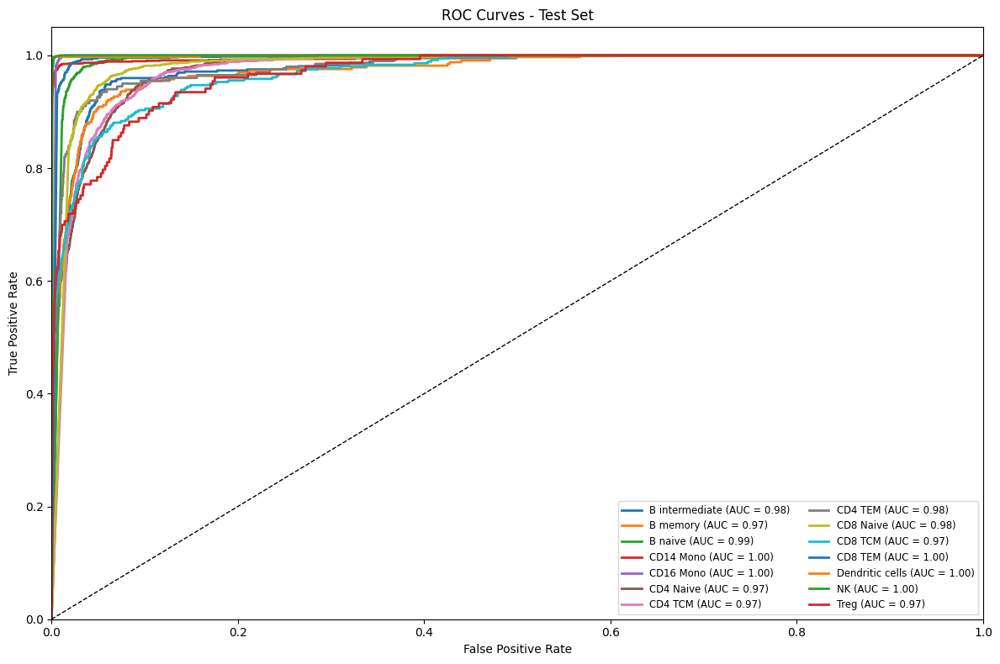

In [13]:
# Binarize the true labels from the test set for multi-class ROC computation
y_test_bin = label_binarize(y_test, classes=range(len(label_encoder.classes_)))
n_classes = y_test_bin.shape[1]  # Total number of classes

# Initialize dictionaries to store ROC curve data for each class
fpr = dict()       # False Positive Rates
tpr = dict()       # True Positive Rates
roc_auc = dict()   # Area Under the Curve for each class

# Compute ROC curve and AUC for each class in a one-vs-rest fashion
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Create a color cycle for plotting distinct curves
colors = cycle(plt.cm.tab10.colors)

# Set up the figure for ROC plots
plt.figure(figsize=(12, 8))

# Plot ROC curve for each class
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f"{label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})")

# Plot the diagonal (random classifier baseline)
plt.plot([0, 1], [0, 1], "k--", lw=1)

# Format plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves - Test Set")

# Add legend with class names and AUC values
plt.legend(loc="lower right", fontsize="small", ncol=2)

# layout adjustments and save
plt.tight_layout()
plt.savefig("Boosted_Random_Forest_Roc_Curves_Test.png")
plt.show()

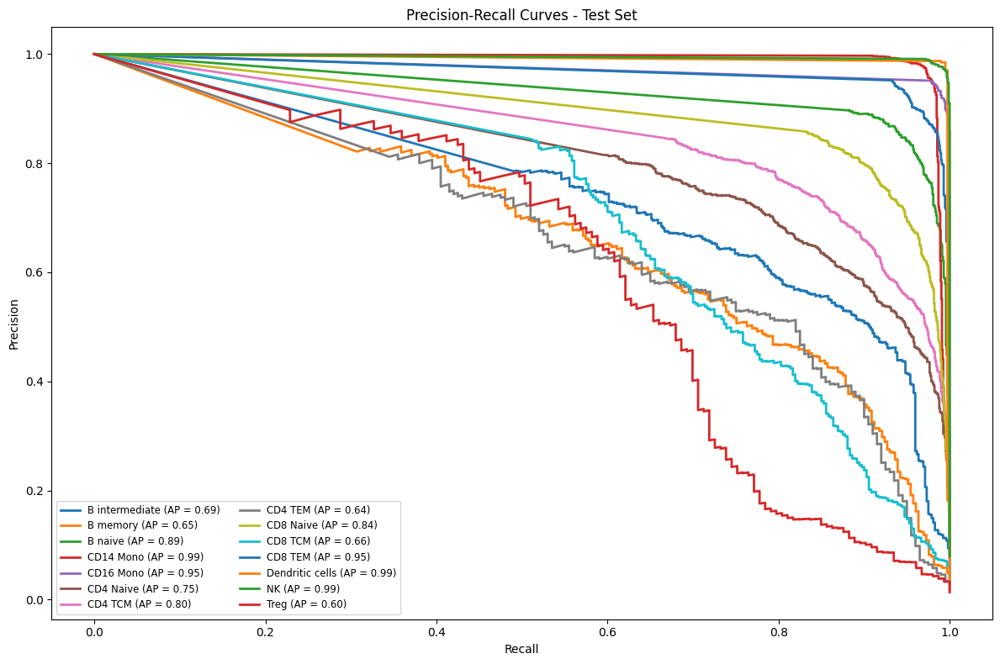

In [14]:
# Initialize dictionaries to store precision, recall, and average precision for each class
precision = dict()
recall = dict()
avg_precision = dict()

# Binarize test set labels
y_test_bin = label_binarize(y_test, classes=range(len(label_encoder.classes_)))

# Create a figure for plotting precision-recall curves
plt.figure(figsize=(12, 8))

# Loop over each class to compute and plot its precision-recall curve
for i, color in zip(range(n_classes), cycle(plt.cm.tab10.colors)):
    # Compute precision and recall values for class i
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_test_proba[:, i])
    
    # Compute average precision (area under the precision-recall curve) for class i
    avg_precision[i] = average_precision_score(y_test_bin[:, i], y_test_proba[:, i])
    
    # Plot the precision-recall curve for class i
    plt.plot(recall[i], precision[i], lw=2, color=color,
             label=f"{label_encoder.classes_[i]} (AP = {avg_precision[i]:.2f})")

# Label the axes and add title
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curves - Test Set")

# Add legend showing class names and AP values
plt.legend(loc="lower left", fontsize="small", ncol=2)

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("Boosted_Random_Forest_Precision_Recall_Curves_Test.png")
plt.show()

/tmp/ipykernel_3572536/3475051785.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=importance_df.head(top_n),


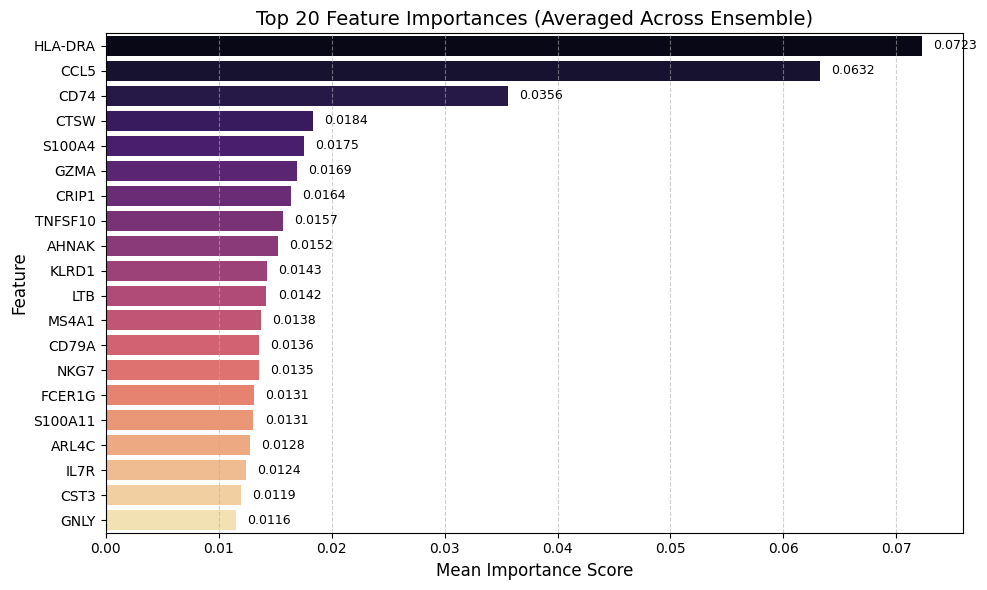

In [16]:
# === Compute and Visualize Feature Importances from BRF Ensemble ===
# Step 1: Extract and average feature importances across the BRF ensemble
feature_importance_matrix = np.array([model.feature_importances_ for model in brf_ensemble])
mean_importance = np.mean(feature_importance_matrix, axis=0)

# Step 2: Use actual gene/feature names from input matrix
feature_names = X_train.columns.tolist()

# Step 3: Create a DataFrame of feature importances
importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Mean Importance": mean_importance
}).sort_values("Mean Importance", ascending=False)

# Step 4: Plot the top N features with numerical annotations
top_n = 20
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=importance_df.head(top_n),
                 x="Mean Importance", y="Feature", palette="magma")

# Add importance values 
for i, (importance, feature) in enumerate(zip(importance_df["Mean Importance"].head(top_n),
                                              importance_df["Feature"].head(top_n))):
    ax.text(x=importance + 0.001, y=i, s=f"{importance:.4f}", va='center', fontsize=9)

# Final plot styling
plt.title(f"Top {top_n} Feature Importances (Averaged Across Ensemble)", fontsize=14)
plt.xlabel("Mean Importance Score", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("Boosted_Random_Forest_Feature_Importance_Val.png")
plt.show()


=== BRF Visualization using Top 50 HVGs ===
PCA components used: 19


/home/hice1/imusayeva3/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[BRF] ARI: 0.7613
Results saved to: ./BRF_results/brf_embedding_eval_50hvg.pkl

=== BRF Visualization using Top 100 HVGs ===
PCA components used: 48


/home/hice1/imusayeva3/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[BRF] ARI: 0.7613
Results saved to: ./BRF_results/brf_embedding_eval_100hvg.pkl

 Displaying BRF visualizations for Top 50 HVGs

 tsne_true_labels_50hvg.png


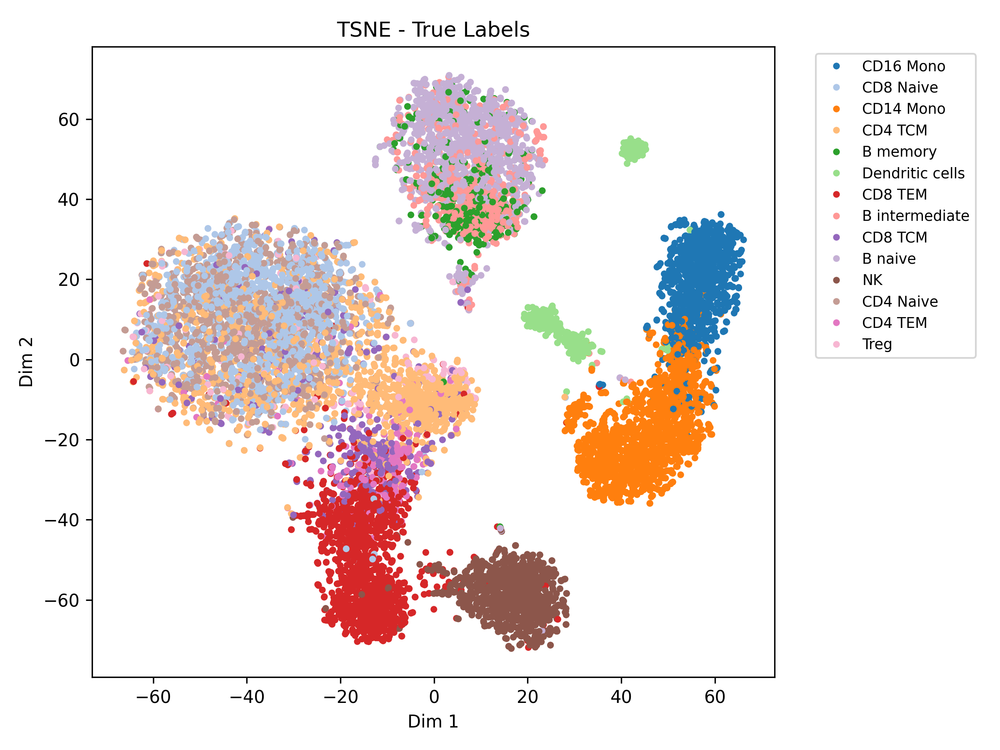


 tsne_brf_predictions_50hvg.png


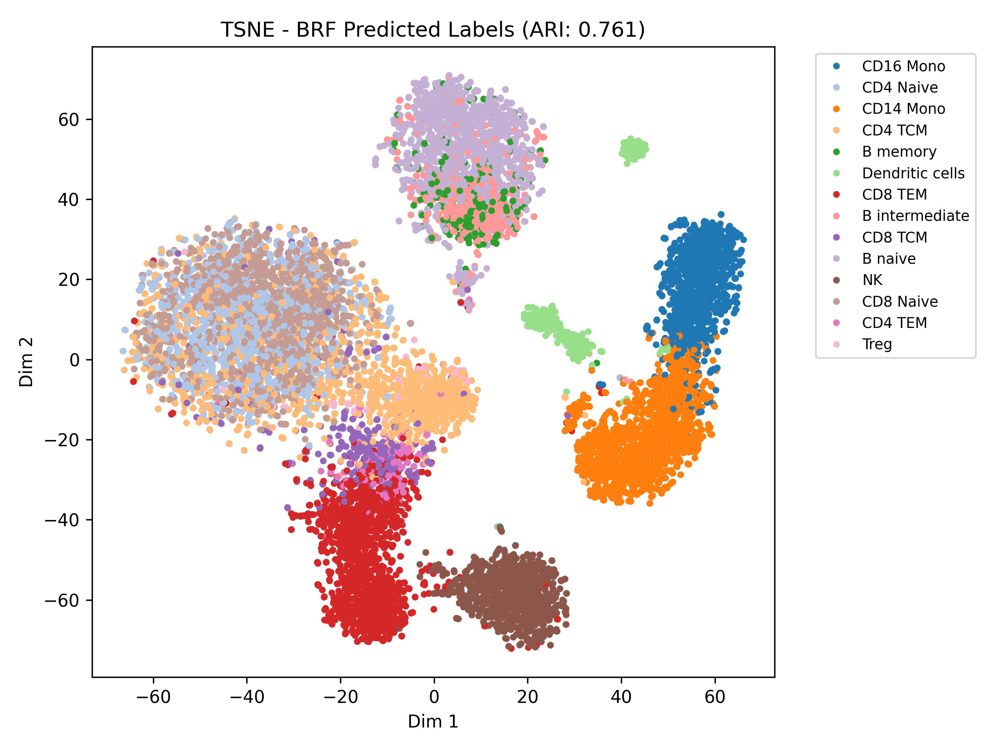


 umap_true_labels_50hvg.png


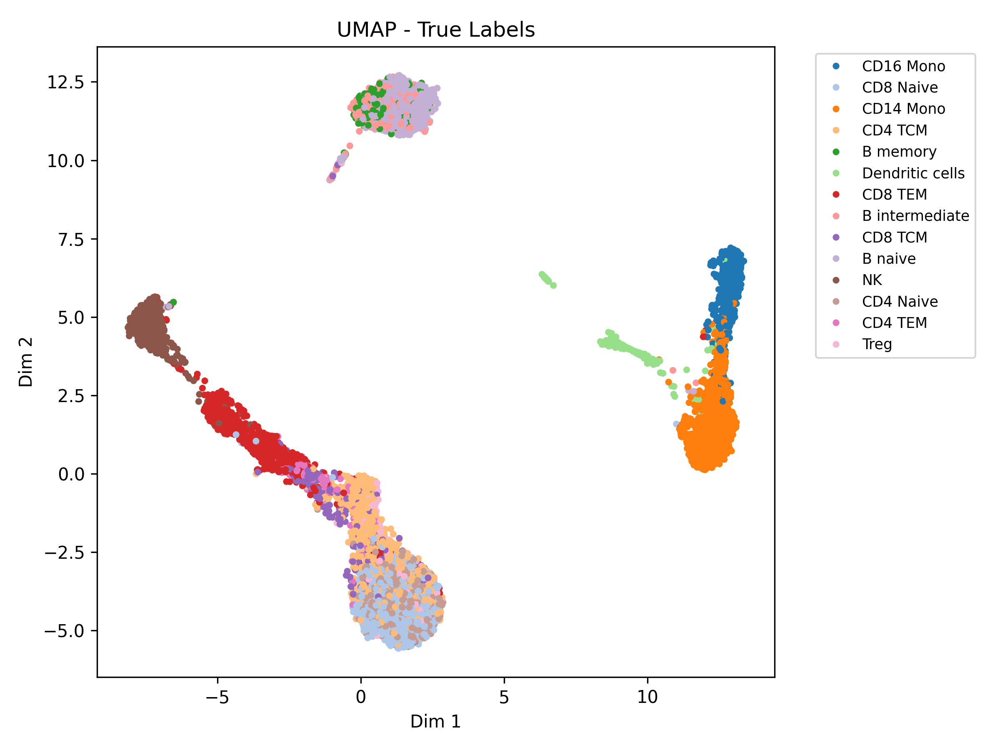


 umap_brf_predictions_50hvg.png


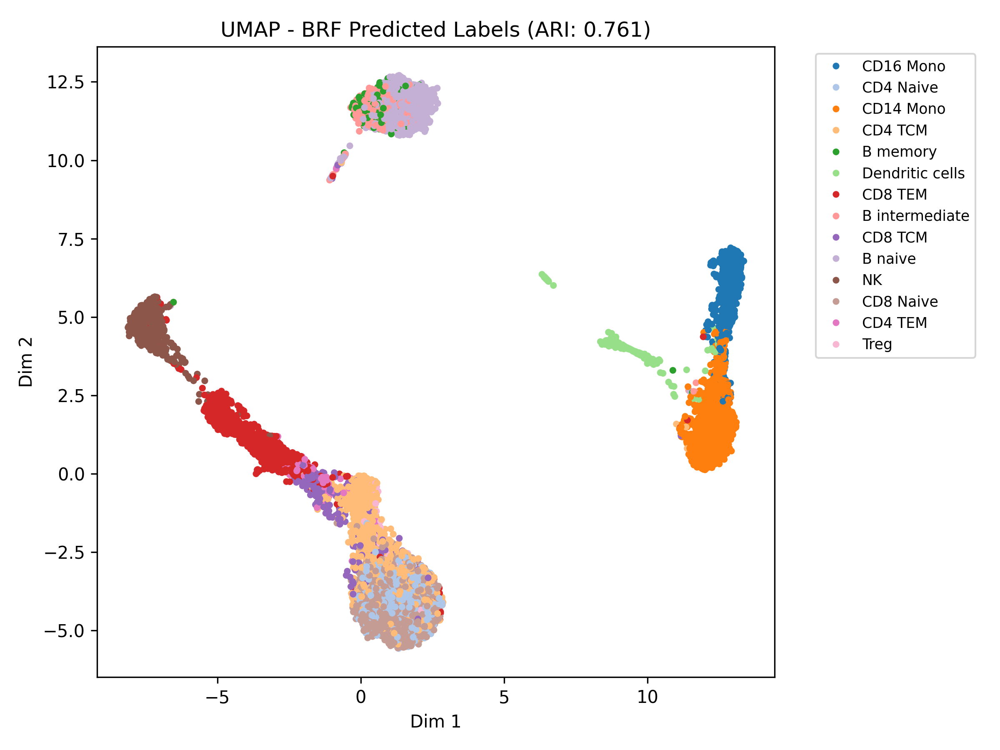


 Displaying BRF visualizations for Top 100 HVGs

 tsne_true_labels_100hvg.png


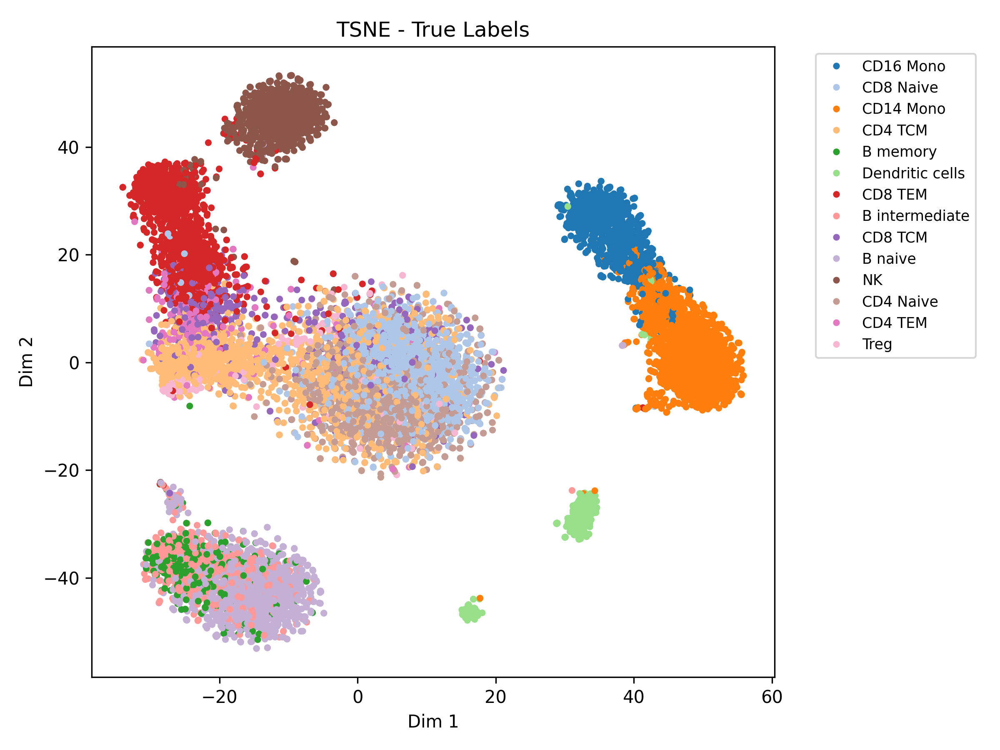


 tsne_brf_predictions_100hvg.png


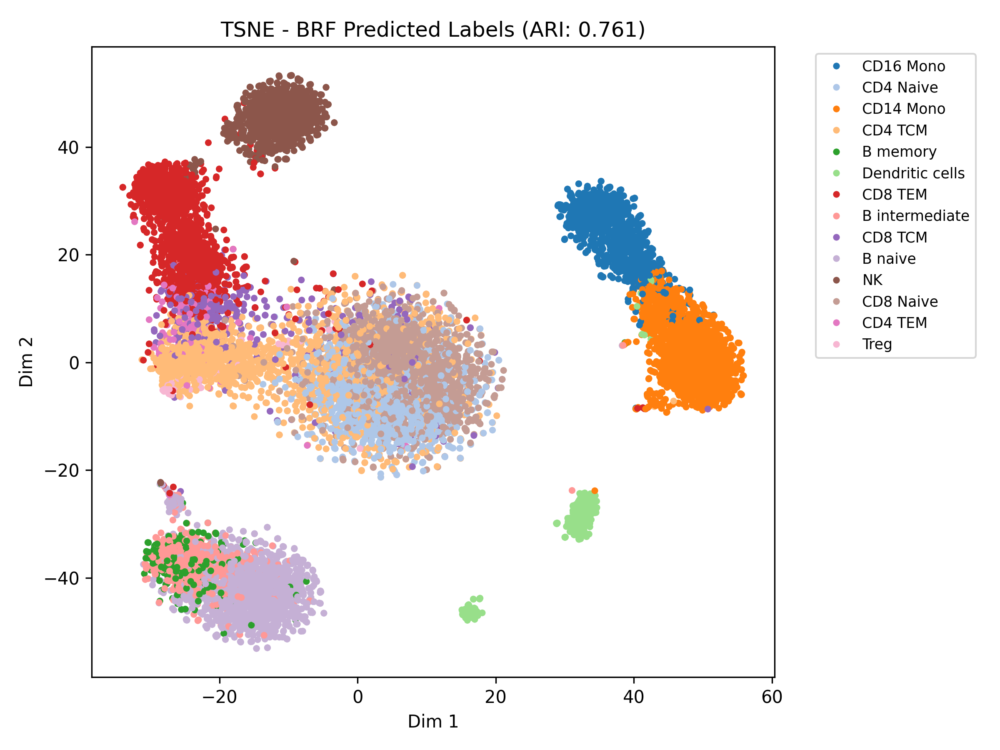


 umap_true_labels_100hvg.png


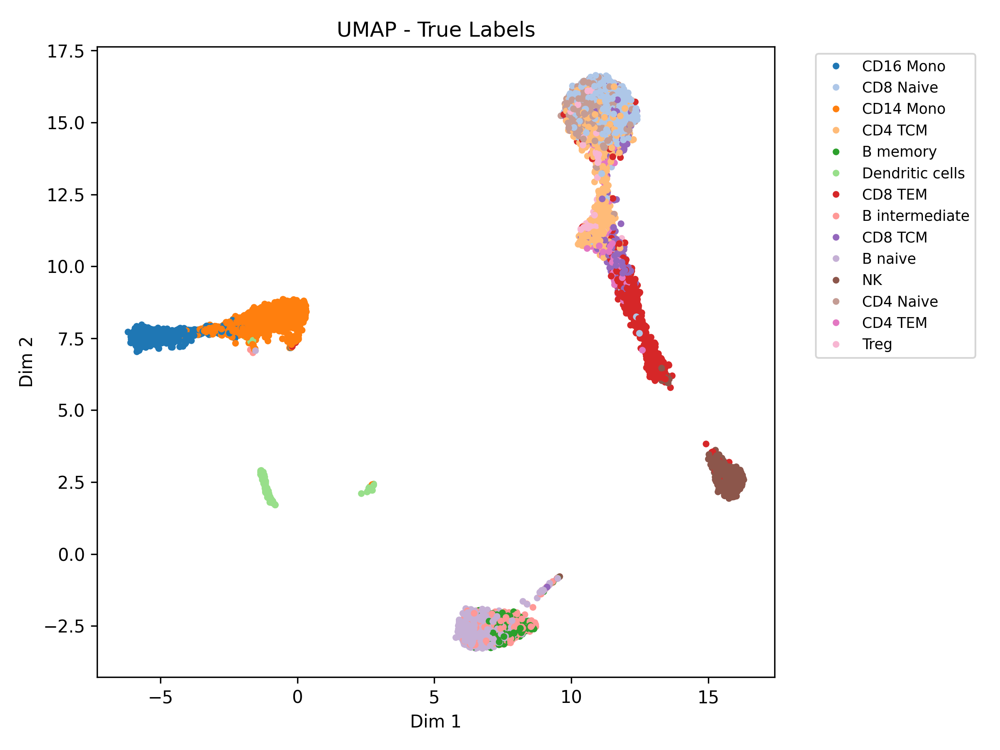


 umap_brf_predictions_100hvg.png


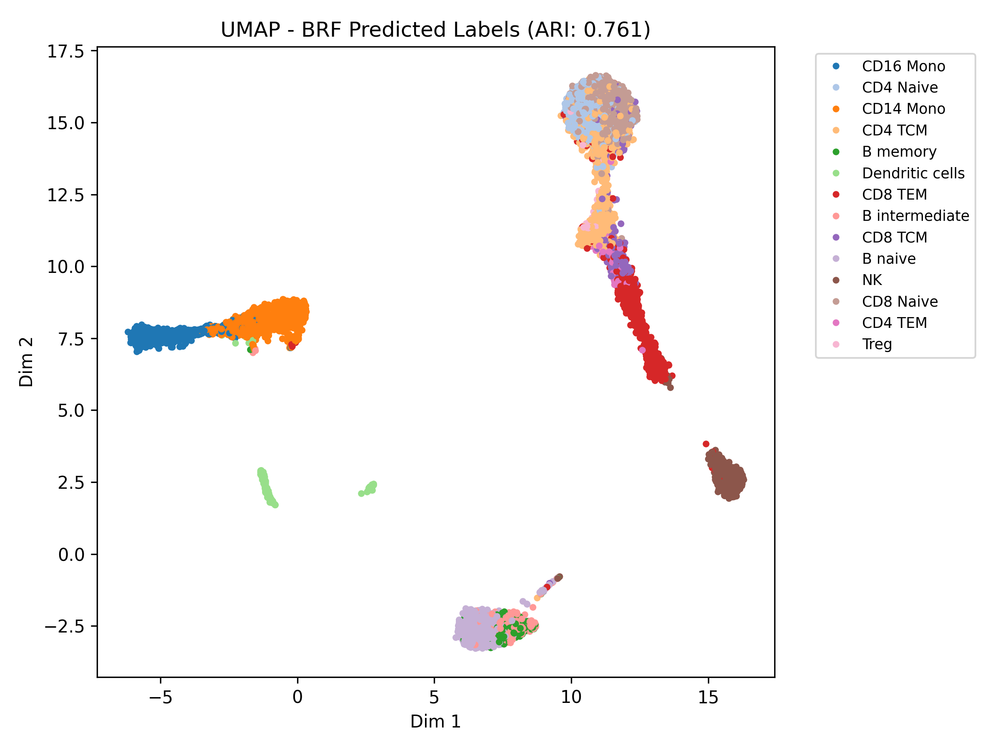

In [35]:
# Understand BRF performance with tsne/umap plot visualizations
def visualize_brf_predictions(
    X_test: pd.DataFrame,
    y_test: np.ndarray,
    y_pred: np.ndarray,
    hvg_count: int,
    results_dir: str = "./BRF_results",
    plot_dir: str = "./BRF_plots",
    random_seed: int = 42
):
    print(f"\n=== BRF Visualization using Top {hvg_count} HVGs ===")

    # Create directories 
    os.makedirs(results_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)

    # True and predicted labels
    true_labels = y_test
    pred_labels = y_pred

    # Label encode for ARI
    le = LabelEncoder()
    true_labels_encoded = le.fit_transform(true_labels)
    pred_labels_encoded = le.transform(pred_labels)
    n_clusters = len(le.classes_)

    # Select HVGs
    gene_var = X_test.var()
    top_genes = gene_var.nlargest(hvg_count).index
    X_hvg = X_test[top_genes]

    # Standardize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_hvg)

    # PCA for dimensionality reduction
    pca = PCA(n_components=0.9, random_state=random_seed)
    X_pca = pca.fit_transform(X_scaled)
    n_components = X_pca.shape[1]
    print(f"PCA components used: {n_components}")

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=30, random_state=random_seed)
    X_tsne = tsne.fit_transform(X_pca)

    # UMAP
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=random_seed)
    X_umap = reducer.fit_transform(X_pca)

    # ARI metric
    ari = adjusted_rand_score(true_labels_encoded, pred_labels_encoded)
    print(f"[BRF] ARI: {ari:.4f}")

    # Internal plotting helper
    def plot_embedding(data, labels, title, filename):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=labels, palette='tab20', s=15, linewidth=0)
        plt.title(title)
        plt.xlabel("Dim 1")
        plt.ylabel("Dim 2")
        plt.legend(loc='best', bbox_to_anchor=(1.05, 1), fontsize='small')
        plt.tight_layout()
        plt.savefig(filename, dpi=300)
        plt.close()

    # Plot embeddings: true labels & BRF predictions
    for name, data in {'tsne': X_tsne, 'umap': X_umap}.items():
        plot_embedding(data, true_labels, f"{name.upper()} - True Labels",
                       os.path.join(plot_dir, f"{name}_true_labels_{hvg_count}hvg.png"))
        plot_embedding(data, pred_labels, f"{name.upper()} - BRF Predicted Labels (ARI: {ari:.3f})",
                       os.path.join(plot_dir, f"{name}_brf_predictions_{hvg_count}hvg.png"))

    # Save results dictionary
    results = {
        'ARI': ari,
        'TrueLabels': true_labels,
        'PredictedLabels': pred_labels,
        'Embeddings': {'tsne': X_tsne, 'umap': X_umap},
        'HVGs': top_genes.tolist(),
        'n_components': n_components
    }
    path = os.path.join(results_dir, f"brf_embedding_eval_{hvg_count}hvg.pkl")
    with open(path, 'wb') as f:
        pickle.dump(results, f)
    print(f"Results saved to: {path}")

visualize_brf_predictions(X_test, decode(y_test), decode(y_test_pred), hvg_count=50)
visualize_brf_predictions(X_test, decode(y_test), decode(y_test_pred), hvg_count=100)

#Check output images
def display_brf_images(plot_dir, hvg_count):
    print(f"\n Displaying BRF visualizations for Top {hvg_count} HVGs")

    # Define image filenames
    image_files = [
        f"tsne_true_labels_{hvg_count}hvg.png",
        f"tsne_brf_predictions_{hvg_count}hvg.png",
        f"umap_true_labels_{hvg_count}hvg.png",
        f"umap_brf_predictions_{hvg_count}hvg.png"
    ]

    # Display each image inline
    for img_file in image_files:
        path = os.path.join(plot_dir, img_file)
        print(f"\n {img_file}")
        display(Image(filename=path))
display_brf_images("./BRF_plots", hvg_count=50)
display_brf_images("./BRF_plots", hvg_count=100)

In [37]:
# Random Forest Implementation
# === Step 1: Define Hyperparameter Grid for Random Forest ===
param_grid = {
    "n_estimators": [100, 200, 300],        # Number of trees in the forest
    "max_depth": [10, 15, 20],              # Max depth of each tree
    "class_weight": ["balanced"]           # Handle class imbalance
}

# === Step 2: Grid Search with 5-Fold Cross-Validation on Truncated Training Data ===
rf_grid = GridSearchCV(
    estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    verbose=1
)
rf_grid.fit(X_train, y_train)

# === Step 3: Extract Best Estimator ===
best_params = rf_grid.best_params_
rf_model = rf_grid.best_estimator_
print(f"\n Best Hyperparameters Found: {best_params}")

# === Step 4: Cross-Validated Metrics on Training Set ===
scoring_metrics = {
    "accuracy": make_scorer(accuracy_score),
    "f1_weighted": make_scorer(f1_score, average="weighted"),
    "precision_weighted": make_scorer(precision_score, average="weighted"),
    "recall_weighted": make_scorer(recall_score, average="weighted"),
}
cv_results = cross_validate(rf_model, X_train, y_train, cv=5, scoring=scoring_metrics)
cv_report = []
for metric, scores in cv_results.items():
    if metric.startswith("test_"):
        metric_name = metric.replace("test_", "").upper()
        mean_score = np.mean(scores)
        std_score = np.std(scores)
        cv_report.append(f"{metric_name}: {mean_score:.4f} ± {std_score:.4f}")
        print(f"{metric_name}: {mean_score:.4f} ± {std_score:.4f}")

# === Step 5: Evaluate on Validation Set ===
y_val_pred = rf_model.predict(X_val)
y_val_pred_labels = label_encoder.inverse_transform(y_val_pred)
y_val_labels = label_encoder.inverse_transform(y_val)
validation_report = classification_report(y_val_labels, y_val_pred_labels)
print("\n Validation Set Performance:")
print(validation_report)

# === Step 6: Evaluate on Test Set ===
y_test_pred = rf_model.predict(X_test)
y_test_pred_labels = label_encoder.inverse_transform(y_test_pred)
y_test_labels = label_encoder.inverse_transform(y_test)
test_report = classification_report(y_test_labels, y_test_pred_labels)
test_accuracy = accuracy_score(y_test_labels, y_test_pred_labels)
print("\n Final Test Set Performance:")
print(test_report)

# === Step 7: Save Model, Predictions, and Results ===
joblib.dump(rf_model, "Random_Forest_Model.pkl")
pd.DataFrame({
    "Actual": y_test_labels,
    "Predicted": y_test_pred_labels
}).to_csv("rf_predictions.csv", index=False)

# Write full performance report to text
results_text = f"""\
ACCURACY: {test_accuracy:.4f}
{"-" * 40}
Cross-Validation Performance:
{chr(10).join(cv_report)}
Validation Set Performance:
{validation_report}

Final Test Set Performance:
{test_report}
"""
with open("Random_Forest_Results.txt", "w") as f:
    f.write(results_text)
print("\n Random Forest training complete!")
print("Model saved to 'Random_Forest_Model.pkl', predictions to 'Random_Forest_Predictions.csv', and results to 'Random_Forest_Results.txt'.")

Fitting 5 folds for each of 9 candidates, totalling 45 fits

 Best Hyperparameters Found: {'class_weight': 'balanced', 'max_depth': 20, 'n_estimators': 300}
ACCURACY: 0.8477 ± 0.0038
F1_WEIGHTED: 0.8421 ± 0.0040
PRECISION_WEIGHTED: 0.8474 ± 0.0044
RECALL_WEIGHTED: 0.8477 ± 0.0038

 Validation Set Performance:
                 precision    recall  f1-score   support

 B intermediate       0.65      0.62      0.64       523
       B memory       0.78      0.45      0.57       329
        B naive       0.83      0.94      0.88      1148
      CD14 Mono       0.97      0.98      0.97      1450
      CD16 Mono       0.98      0.98      0.98       953
      CD4 Naive       0.67      0.77      0.72      1067
        CD4 TCM       0.77      0.75      0.76      1387
        CD4 TEM       0.68      0.41      0.51       200
      CD8 Naive       0.80      0.86      0.83      1361
        CD8 TCM       0.76      0.57      0.65       360
        CD8 TEM       0.91      0.94      0.92      1296
Dend

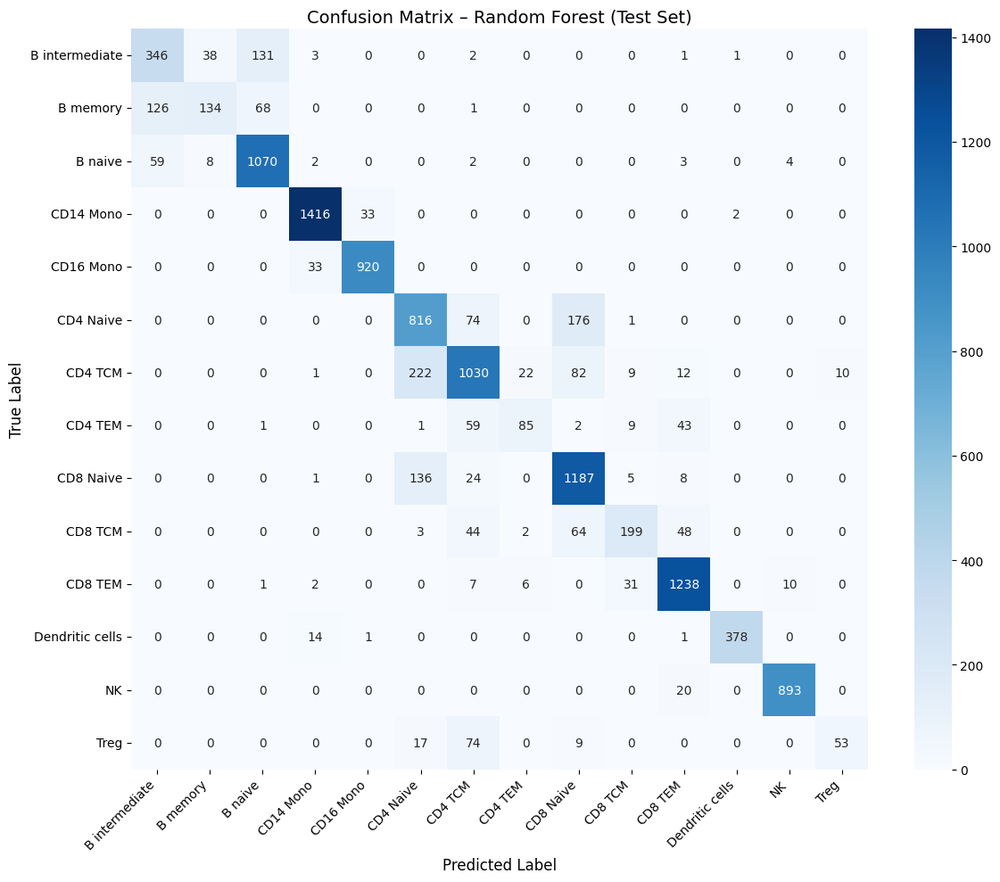

In [38]:
# === Step 1: Generate Confusion Matrix ===
cm = confusion_matrix(y_test_labels, y_test_pred_labels, labels=label_encoder.classes_)

# === Step 2: Create a Heatmap Plot ===
plt.figure(figsize=(12, 10))

# Use seaborn to visualize the confusion matrix
# - annot=True: show cell values
# - fmt='d': format as integers
# - cmap='Blues': blue color scale
# - xticklabels/yticklabels: class names
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)
# Set axis labels and title
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.title("Confusion Matrix – Random Forest (Test Set)", fontsize=14)

# save the figure
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.savefig("Random_Forest_Confusion_Matrix_Test.png", dpi=300)
plt.show()

/tmp/ipykernel_3572536/691067373.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


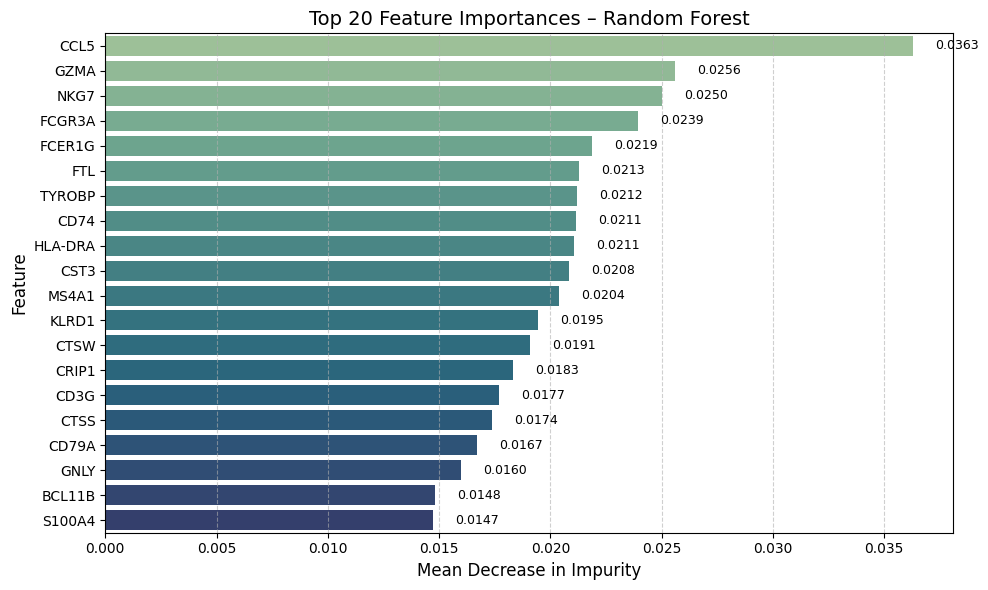

In [39]:
# === Step 1: Extract Feature Importances from the Trained RF Model ===
feature_names = X_train.columns.tolist()
importances = rf_model.feature_importances_

# Create a DataFrame for better handling and plotting
importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values("Importance", ascending=False)

# === Step 2: Plot Top N Important Features ===
top_n = 20  
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=importance_df.head(top_n),
    x="Importance", y="Feature", palette="crest"
)
# Annotate bars 
for i, (importance, feature) in enumerate(zip(importance_df["Importance"].head(top_n),
                                              importance_df["Feature"].head(top_n))):
    ax.text(x=importance + 0.001, y=i, s=f"{importance:.4f}", va='center', fontsize=9)
# Add titles and styling
plt.title(f"Top {top_n} Feature Importances – Random Forest", fontsize=14)
plt.xlabel("Mean Decrease in Impurity", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save figure 
plt.savefig("Random_Forest_Feature_Importance_top20.png", dpi=300)
plt.show()

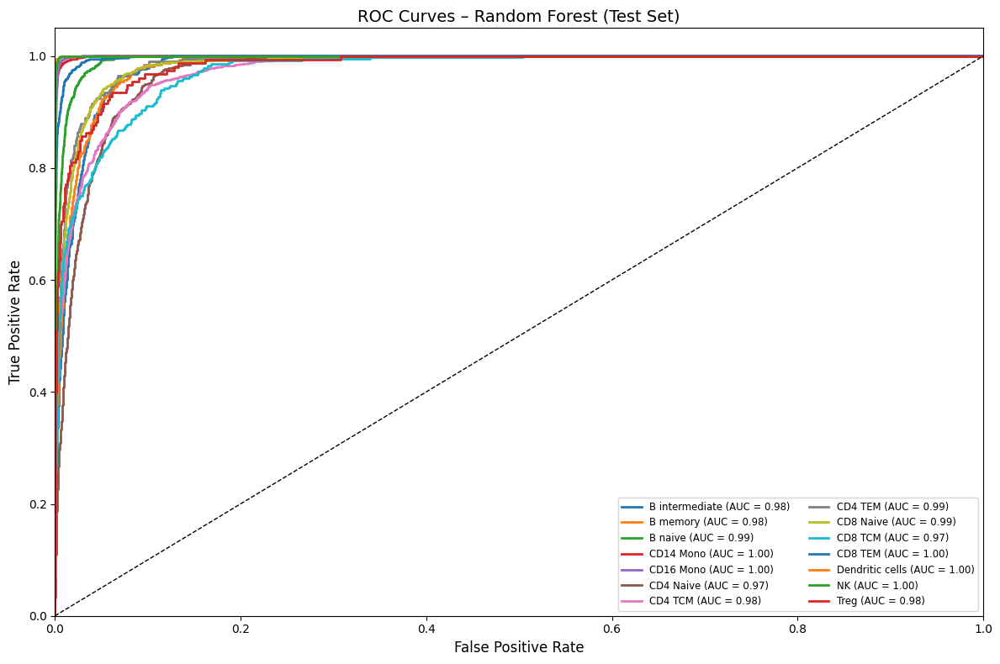

In [40]:
# === Step 1: Binarize the true labels for multi-class ROC ===
y_test_bin = label_binarize(y_test, classes=range(len(label_encoder.classes_)))
n_classes = y_test_bin.shape[1]

# === Step 2: Get predicted probabilities from Random Forest ===
y_score = rf_model.predict_proba(X_test)

# === Step 3: Compute FPR, TPR, and AUC for each class ===
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# === Step 4: Plot ROC curves ===
colors = cycle(plt.cm.tab10.colors)
plt.figure(figsize=(12, 8))

# Loop through each class and plot its ROC curve
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f"{label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})")

# Add diagonal line as a random guess baseline
plt.plot([0, 1], [0, 1], 'k--', lw=1)

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.title("ROC Curves – Random Forest (Test Set)", fontsize=14)
plt.legend(loc="lower right", fontsize="small", ncol=2)
plt.tight_layout()
plt.savefig("Random_Forest_Roc_Curve_Test.png", dpi=300)
plt.show()

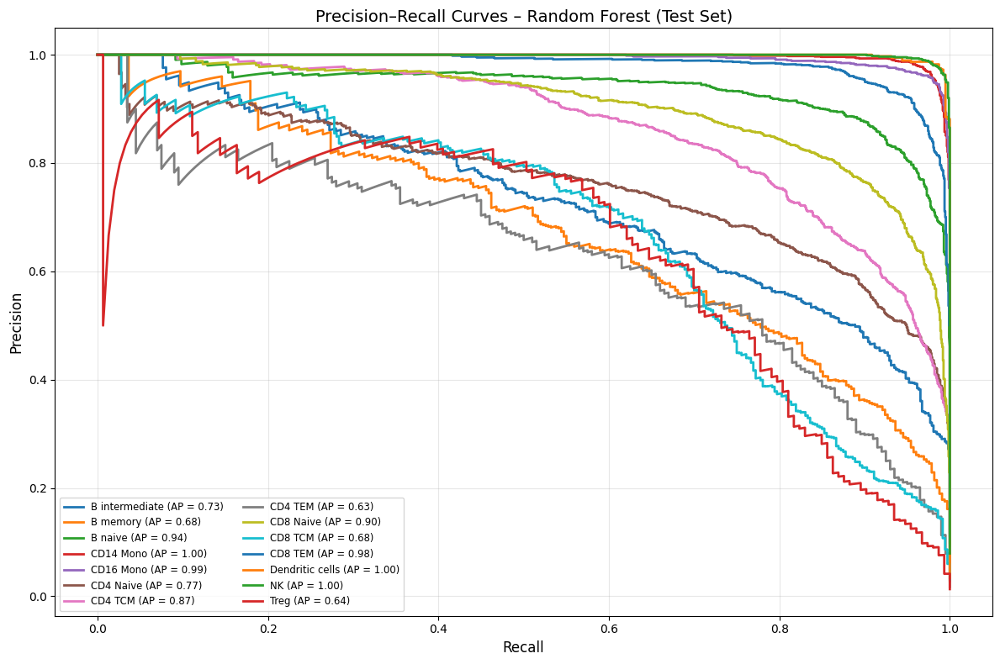

In [41]:
# === Step 1: Binarize the true labels for multi-class PR calculation ===
y_test_bin = label_binarize(y_test, classes=range(len(label_encoder.classes_)))
n_classes = y_test_bin.shape[1]

# === Step 2: Get predicted probabilities from trained RF model ===
y_score = rf_model.predict_proba(X_test)

# === Step 3: Compute precision, recall, and AP score per class ===
precision = dict()
recall = dict()
avg_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
    avg_precision[i] = average_precision_score(y_test_bin[:, i], y_score[:, i])

# === Step 4: Plot Precision–Recall curves ===
colors = cycle(plt.cm.tab10.colors)
plt.figure(figsize=(12, 8))

for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], lw=2, color=color,
             label=f"{label_encoder.classes_[i]} (AP = {avg_precision[i]:.2f})")
# Plot formatting
plt.xlabel("Recall", fontsize=12)
plt.ylabel("Precision", fontsize=12)
plt.title("Precision–Recall Curves – Random Forest (Test Set)", fontsize=14)
plt.legend(loc="lower left", fontsize="small", ncol=2)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("Random_Forest_Precision_Recall_Curve_Test.png", dpi=300)
plt.show()


=== RF Visualization using Top 50 HVGs ===
PCA components used: 19


/home/hice1/imusayeva3/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[RF] ARI: 0.7448
Results saved to: ./RF_results/rf_embedding_eval_50hvg.pkl

=== RF Visualization using Top 100 HVGs ===
PCA components used: 48


/home/hice1/imusayeva3/.local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[RF] ARI: 0.7448
Results saved to: ./RF_results/rf_embedding_eval_100hvg.pkl

Displaying RF visualizations for Top 50 HVGs

tsne_true_labels_rf_50hvg.png


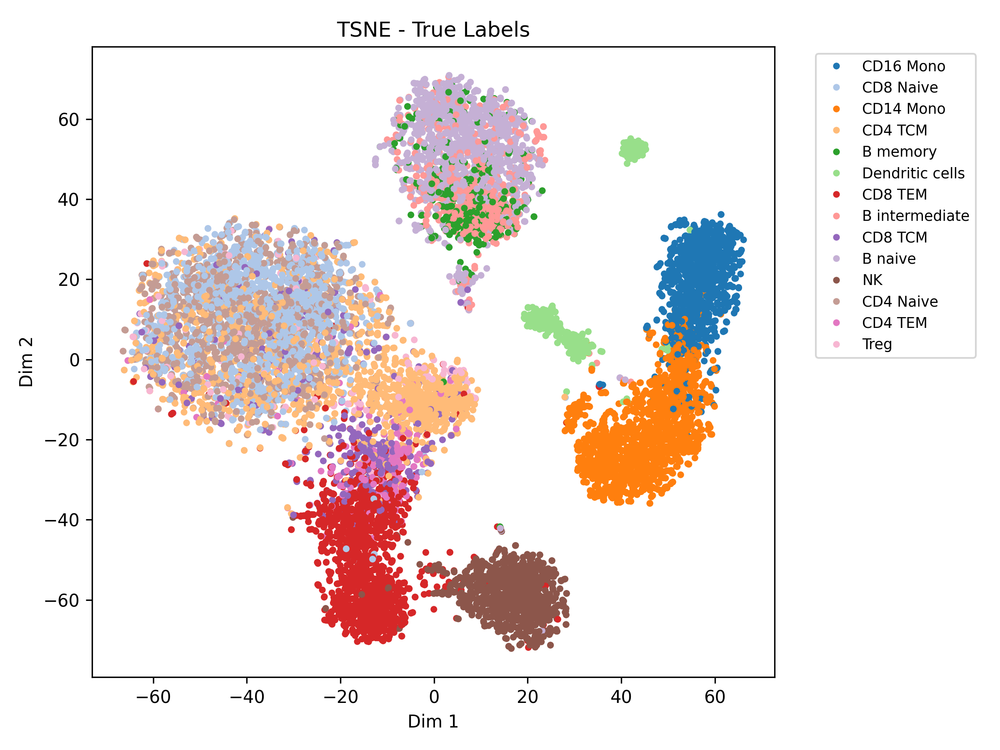


tsne_rf_predictions_50hvg.png


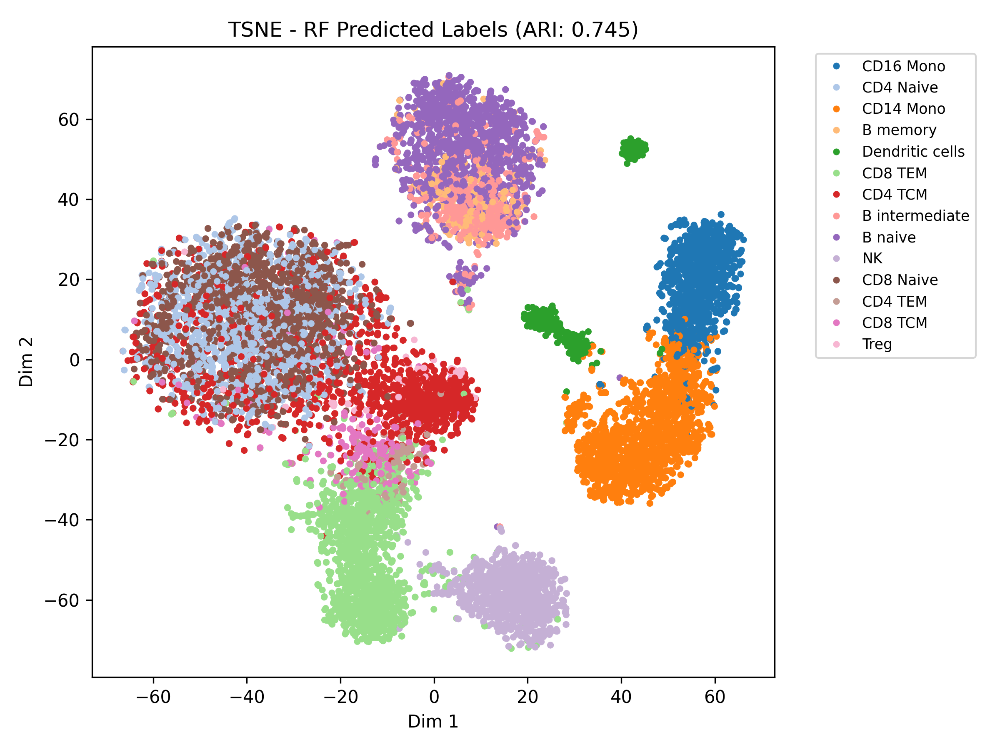


umap_true_labels_rf_50hvg.png


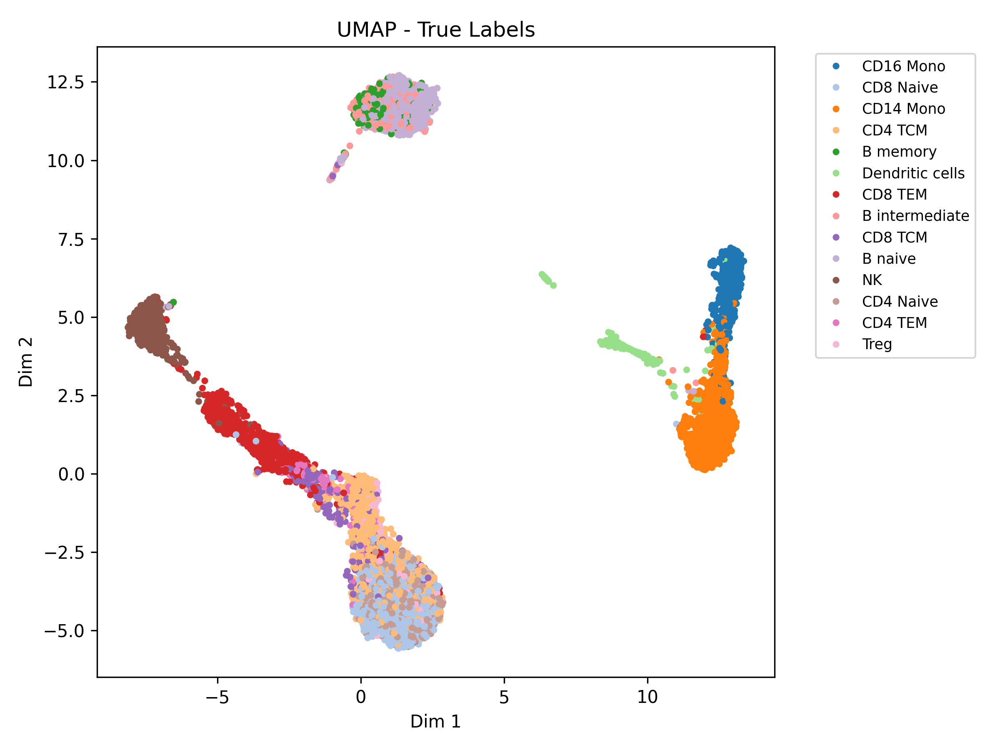


umap_rf_predictions_50hvg.png


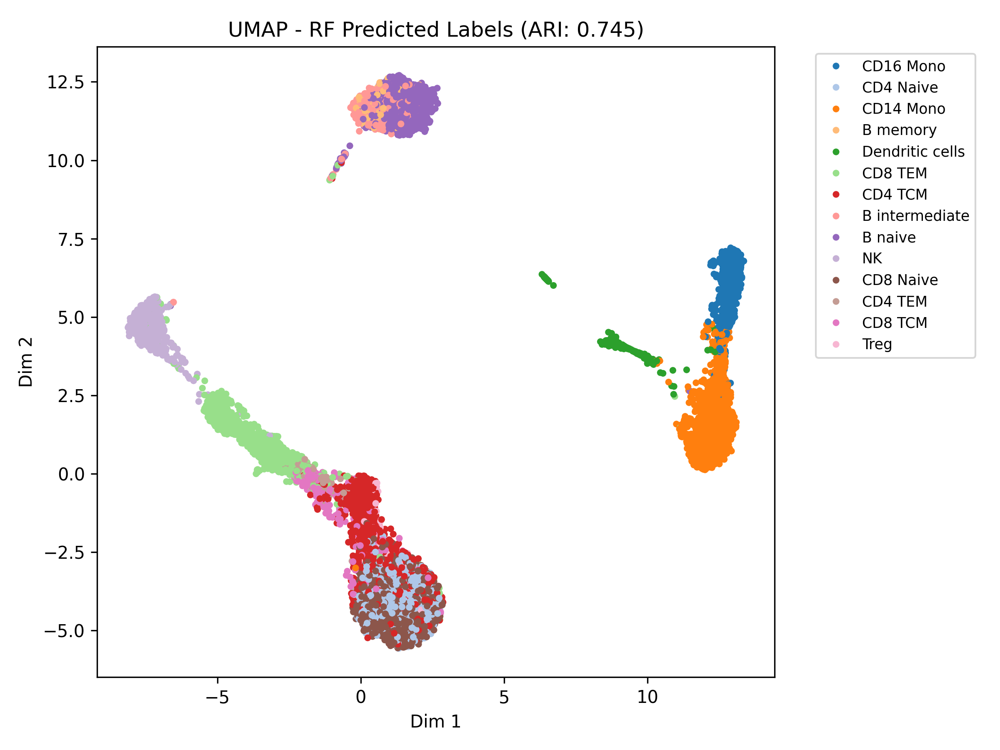


Displaying RF visualizations for Top 100 HVGs

tsne_true_labels_rf_100hvg.png


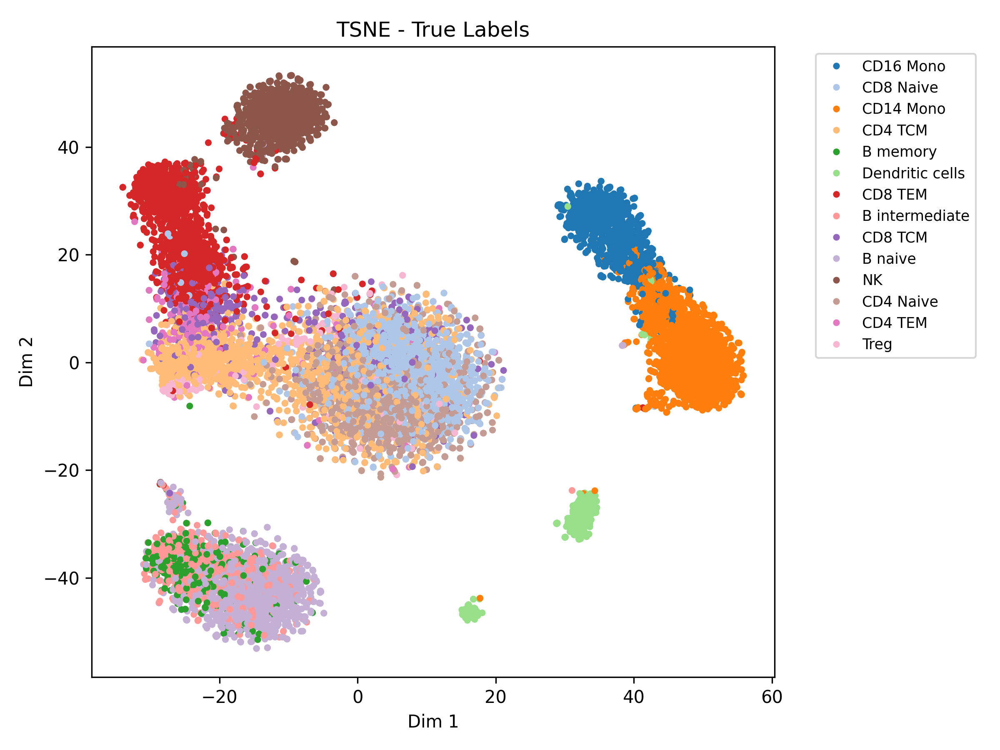


tsne_rf_predictions_100hvg.png


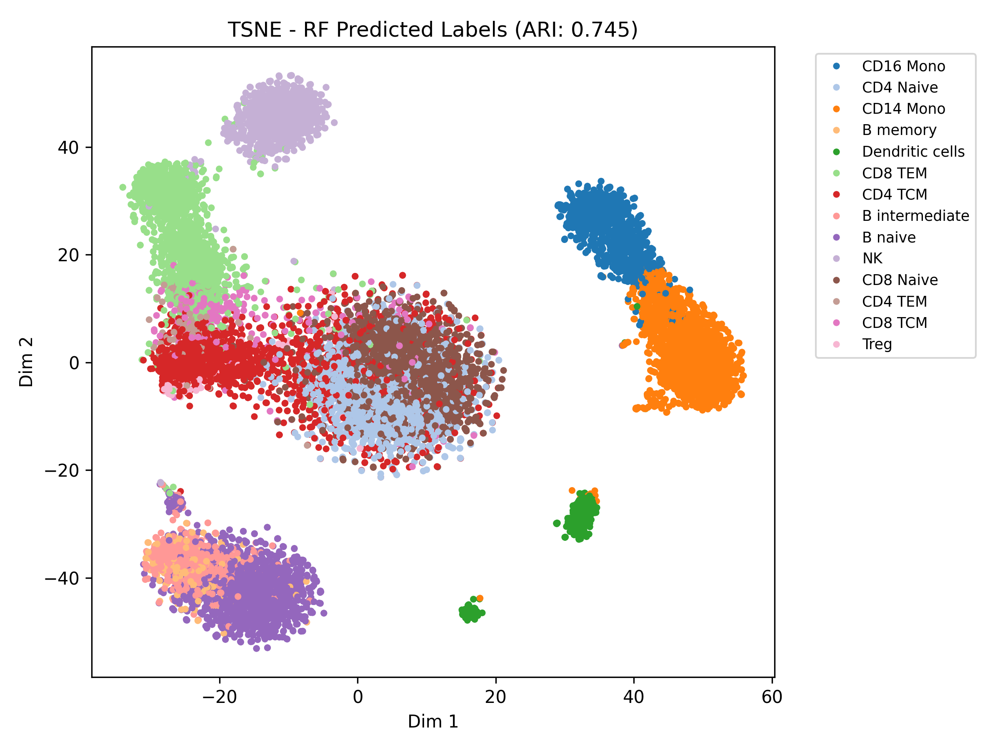


umap_true_labels_rf_100hvg.png


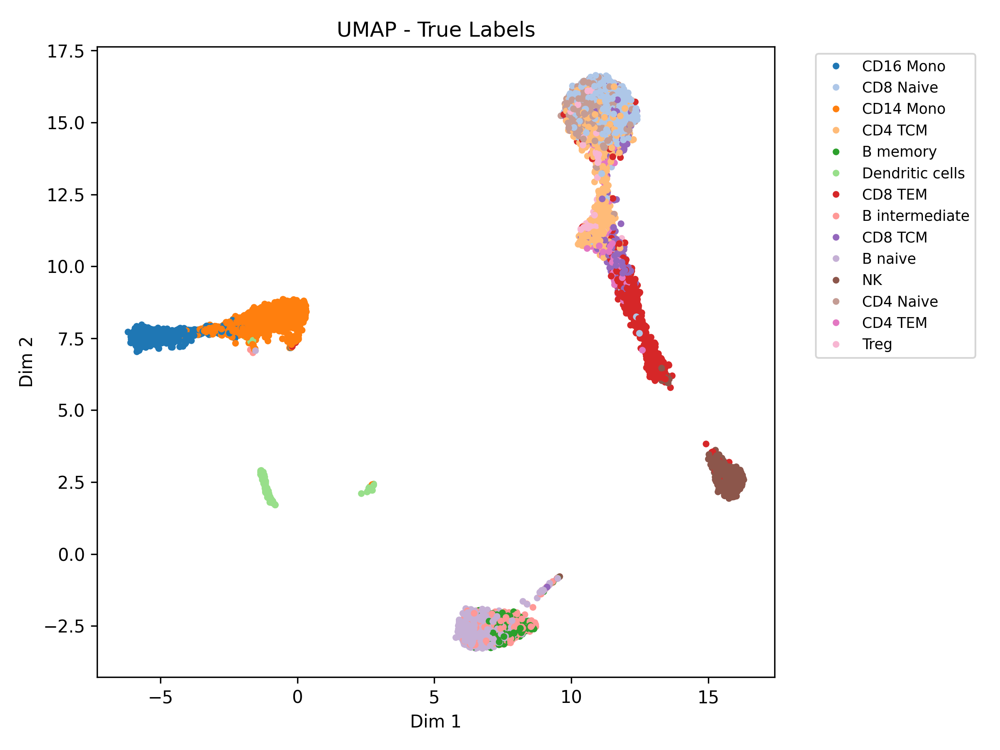


umap_rf_predictions_100hvg.png


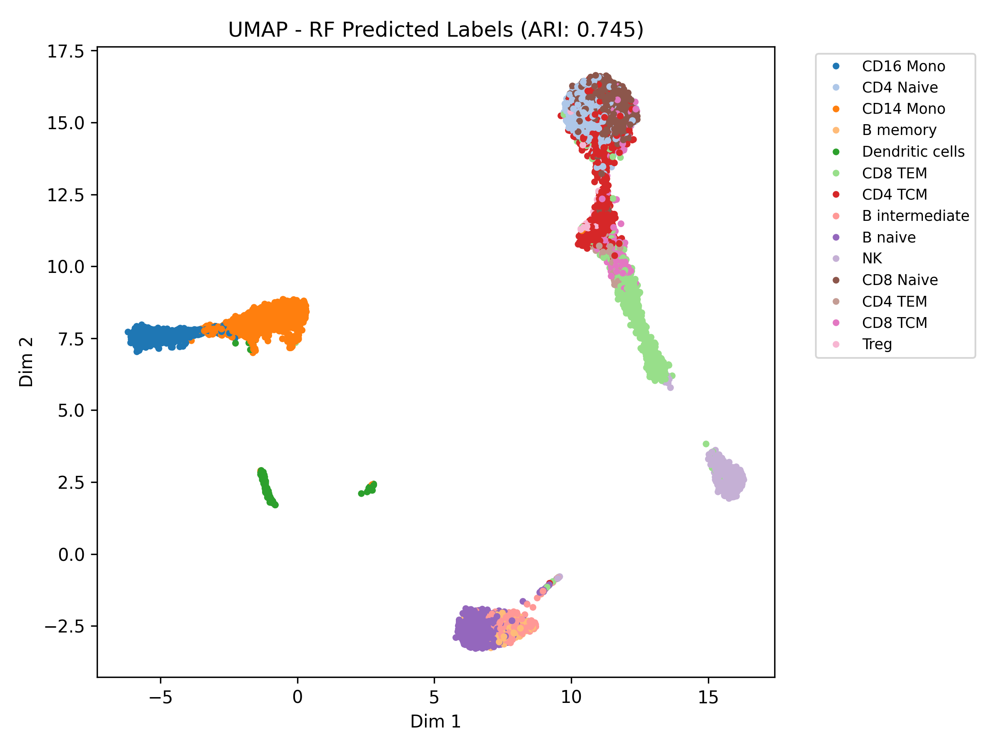

In [48]:
# Understanding Random Forest Performance with tsne/umap visualization of true and predicted labels
# === Visualize Random Forest Predictions using t-SNE and UMAP ===
# This function plots the true and predicted test labels in 2D using dimensionality reduction.
def visualize_rf_predictions(
    X_test: pd.DataFrame,
    y_test: np.ndarray,
    y_pred: np.ndarray,
    hvg_count: int,
    results_dir: str = "./RF_results",
    plot_dir: str = "./RF_plots",
    random_seed: int = 42
):
    print(f"\n=== RF Visualization using Top {hvg_count} HVGs ===")

    # Create output folders
    os.makedirs(results_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)

    # Assign true and predicted labels
    true_labels = y_test
    pred_labels = y_pred

    # Encode labels numerically for ARI calculation
    le = LabelEncoder()
    true_labels_encoded = le.fit_transform(true_labels)
    pred_labels_encoded = le.transform(pred_labels)

    # Select the top HVGs (Highly Variable Genes)
    gene_var = X_test.var()
    top_genes = gene_var.nlargest(hvg_count).index
    X_hvg = X_test[top_genes]

    # Scale features to zero mean and unit variance
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_hvg)

    # Reduce dimensionality using PCA (retain 90% of total variance)
    pca = PCA(n_components=0.9, random_state=random_seed)
    X_pca = pca.fit_transform(X_scaled)
    print(f"PCA components used: {X_pca.shape[1]}")

    # Apply t-SNE embedding (2D)
    tsne = TSNE(n_components=2, perplexity=30, random_state=random_seed)
    X_tsne = tsne.fit_transform(X_pca)

    # Apply UMAP embedding (2D)
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=random_seed)
    X_umap = reducer.fit_transform(X_pca)

    # Compute ARI (how well predicted clusters match true labels)
    ari = adjusted_rand_score(true_labels_encoded, pred_labels_encoded)
    print(f"[RF] ARI: {ari:.4f}")

    # Helper function to create and save a 2D scatterplot
    def plot_embedding(data, labels, title, filename):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=labels, palette='tab20', s=15, linewidth=0)
        plt.title(title)
        plt.xlabel("Dim 1")
        plt.ylabel("Dim 2")
        plt.legend(loc='best', bbox_to_anchor=(1.05, 1), fontsize='small')
        plt.tight_layout()
        plt.savefig(filename, dpi=300)
        plt.close()

    # Generate and save both true and predicted label plots for t-SNE and UMAP
    for name, data in {'tsne': X_tsne, 'umap': X_umap}.items():
        plot_embedding(data, true_labels, f"{name.upper()} - True Labels",
                       os.path.join(plot_dir, f"{name}_true_labels_rf_{hvg_count}hvg.png"))
        plot_embedding(data, pred_labels, f"{name.upper()} - RF Predicted Labels (ARI: {ari:.3f})",
                       os.path.join(plot_dir, f"{name}_rf_predictions_{hvg_count}hvg.png"))

    # Save results as a dictionary 
    results = {
        'ARI': ari,
        'TrueLabels': true_labels,
        'PredictedLabels': pred_labels,
        'Embeddings': {'tsne': X_tsne, 'umap': X_umap},
        'HVGs': top_genes.tolist(),
        'n_components': X_pca.shape[1]
    }
    path = os.path.join(results_dir, f"rf_embedding_eval_{hvg_count}hvg.pkl")
    with open(path, 'wb') as f:
        pickle.dump(results, f)
    print(f"Results saved to: {path}")

# === Display Saved RF Visualization Images ===
def display_rf_images(plot_dir, hvg_count):
    print(f"\nDisplaying RF visualizations for Top {hvg_count} HVGs")
    image_files = [
        f"tsne_true_labels_rf_{hvg_count}hvg.png",
        f"tsne_rf_predictions_{hvg_count}hvg.png",
        f"umap_true_labels_rf_{hvg_count}hvg.png",
        f"umap_rf_predictions_{hvg_count}hvg.png"
    ]
    for img_file in image_files:
        path = os.path.join(plot_dir, img_file)
        print(f"\n{img_file}")
        display(Image(filename=path))

# === Run the RF Visualization Process ===
visualize_rf_predictions(X_test, decode(y_test), decode(y_test_pred), hvg_count=50)
visualize_rf_predictions(X_test, decode(y_test), decode(y_test_pred), hvg_count=100)

# === Display the Generated Plots ===
display_rf_images("./RF_plots", hvg_count=50)
display_rf_images("./RF_plots", hvg_count=100)
